In [ ]:
To integrate both codes — the GAN-based image generation with the Stable Diffusion + ControlNet pipeline — you can 
combine the two sections in a modular way. 
The goal is to make sure the flow from loading the image to generating images through both models works seamlessly.

Is this a gan model?

Yes, the code you provided uses a Stable Diffusion model with ControlNet, which is a type of
Generative Adversarial Network(GAN)-based model for image generation and manipulation.
Here's a breakdown of how it works:

Key Points:

Stable Diffusion:
It’s a generative model that generates high-quality images based on text prompts. 
It uses diffusion models to iteratively transform random noise into an image.

ControlNet:
ControlNet is an additional model that guides the image generation process using external conditions
such as the edge-detected image you’re using in your code. By using control images (like edges),
the model can generate more specific or controlled outputs that align with the given input.
    
Pipeline:
The StableDiffusionControlNetPipeline in your code combines both the Stable Diffusion model and ControlNet to allo
for the generation of images based on both text prompts and control images (like the edge-detected version of the bird).
This enhances the control over the generated output, allowing for more specific adjustments.

Canny Edge Detection:
You use Canny edge detection on the input image (the bird) to create a control image, which provides structural
guidance for the model to generate a modified image

Summary:
This is indeed a GAN-based image generation pipeline. The primary model (Stable Diffusion) is a diffusion model
(a form of generative model), and ControlNet acts as an additional guiding mechanism to enhance control over the 
generated images.


Epoch [1000/10000], Loss D: 0.6888, Loss G: 0.6771
Epoch [2000/10000], Loss D: 0.6937, Loss G: 0.6925
Epoch [3000/10000], Loss D: 0.7020, Loss G: 0.7006
Epoch [4000/10000], Loss D: 0.6933, Loss G: 0.6859
Epoch [5000/10000], Loss D: 0.6931, Loss G: 0.6862
Epoch [6000/10000], Loss D: 0.6932, Loss G: 0.6941
Epoch [7000/10000], Loss D: 0.6932, Loss G: 0.6932
Epoch [8000/10000], Loss D: 0.6931, Loss G: 0.6874
Epoch [9000/10000], Loss D: 0.6932, Loss G: 0.6939
Epoch [10000/10000], Loss D: 0.6932, Loss G: 0.6931


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

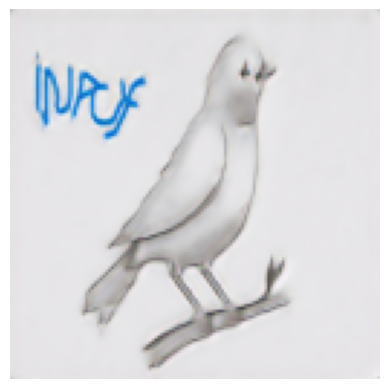

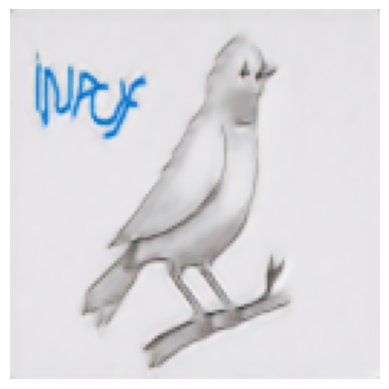

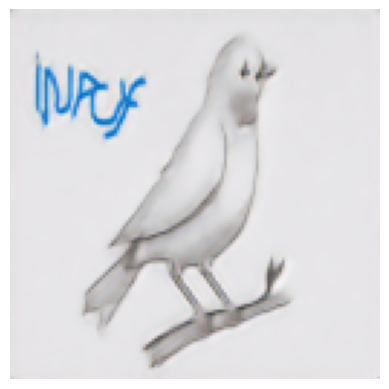

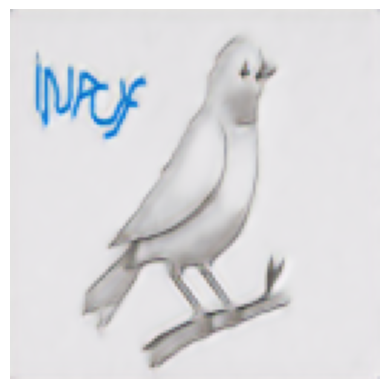

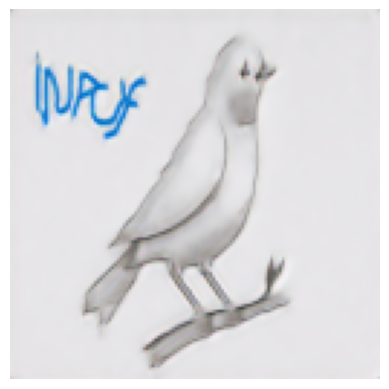

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/bird-ganh/bird.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop ============
def train_singan(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        if (epoch + 1) % 1000 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")

    return generator

# ============ 5️⃣ Generate Surreal Images using GAN ============
def generate_image(generator, image_tensor, num_images=5):
    generator.eval()
    
    with torch.no_grad():
        for i in range(num_images):
            latent_vector = torch.randn(1, 128).to(device)
            feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
            
            fake_image = generator(image_tensor.to(device), latent_vector, feature_vector)
            fake_image = fake_image.cpu().squeeze(0).permute(1, 2, 0).numpy()
            fake_image = (fake_image + 1) / 2  # Normalize to [0,1]

            plt.imshow(fake_image)
            plt.axis("off")
            plt.show()

# ============ 6️⃣ Define Stable Diffusion + ControlNet for Modified Image ============
def generate_modified_image(input_image, control_image):
    controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
    pipe = StableDiffusionControlNetPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        controlnet=controlnet,
        torch_dtype=torch.float16
    )
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
    pipe.to(device)

    prompt = "A surreal fantasy bird with horns, glowing eyes, and mystical wings, ultra-detailed, 4K, digital painting"
    negative_prompt = "blurry, low quality, distorted"

    generated_image = pipe(
        prompt=prompt,
        image=control_image,  # Use edge-detected image as control input
        negative_prompt=negative_prompt,
        num_inference_steps=30
    ).images[0]

    return generated_image

# ============ 7️⃣ Main Code to Run Everything ============
# Train the GAN model
generator = train_singan(image_tensor)

# Generate a modified image using both GAN and Stable Diffusion
modified_image = generate_modified_image(input_image, control_image)

# ============ 8️⃣ Save & Display Final Image ============
modified_image.save("modified_bird_final.png")
modified_image.show()

# Optionally, generate surreal images using GAN
generate_image(generator, image_tensor)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

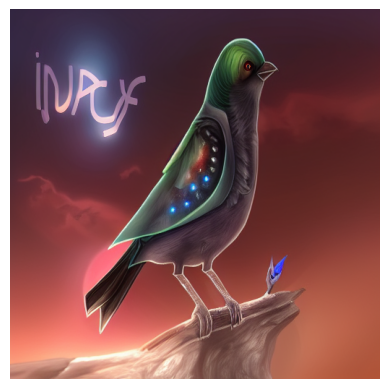

In [12]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============ 1️⃣ Load Image & Extract Edges ============
def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/bird-ganh/bird.jpg"  # Replace with your image path
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Load Stable Diffusion + ControlNet ============
device = "cuda" if torch.cuda.is_available() else "cpu"

controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to(device)

# ============ 3️⃣ Generate Modified Image ============
prompt = "A surreal fantasy bird with horns, glowing eyes, and mystical 100 wings, ultra-detailed, 4K, digital painting"
negative_prompt = "blurry, low quality, distorted"

generated_image = pipe(
    prompt=prompt,
    image=control_image,  # Use edge-detected image as control input
    negative_prompt=negative_prompt,
    num_inference_steps=30
).images[0]

# ============ 4️⃣ Display Generated Image ============
# Show the image directly in the notebook
plt.imshow(generated_image)
plt.axis("off")  # Hide axes
plt.show()


Yes, the code you've provided defines a **Generative Adversarial Network (GAN) model**. It includes both a **generator** and a **discriminator**, which are the key components of a GAN:

**Generator:** This model generates synthetic images from random latent vectors (and additional feature vectors). The Generator class includes:
     A fully connected layer to map the latent vector to a larger image space.
     Several convolutional layers for generating an image output.
     
**Discriminator:** This model tries to distinguish between real and fake images. The **Discriminator** class:
      Uses convolutional layers to process images and output a probability of whether the image is real or fake.
      
**Training:** The training loop involves:
     Training the discriminator to correctly classify real vs. fake images.
     Training the generator to fool the discriminator by generating images that the discriminator classifies as          real.
     
The purpose of the **GAN** is to progressively improve the **generator's** ability to create realistic images as the **discriminator** improves its ability to distinguish fake images.

Additionally, in your code, you are also using Stable Diffusion with ControlNet to generate modified images based on a "control image" (an edge-detected version of the input image) after a certain number of epochs, showcasing how you could integrate **GANs** with a pre-trained model like Stable Diffusion.

So in short, **yes**, this is a **GAN model**, with the additional capability of generating images using **Stable Diffusion at specified intervals** during training.

Epoch [1000/10000], Loss D: 0.6942, Loss G: 0.6703


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

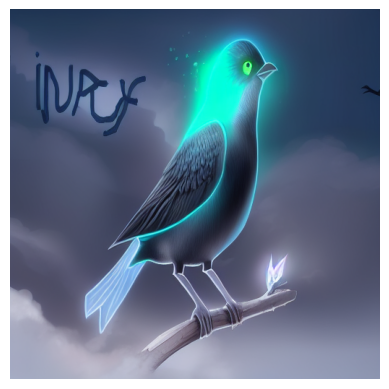

Epoch [2000/10000], Loss D: 0.6937, Loss G: 0.6828


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

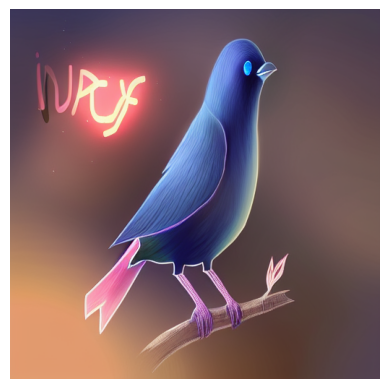

Epoch [3000/10000], Loss D: 0.6930, Loss G: 0.6776


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

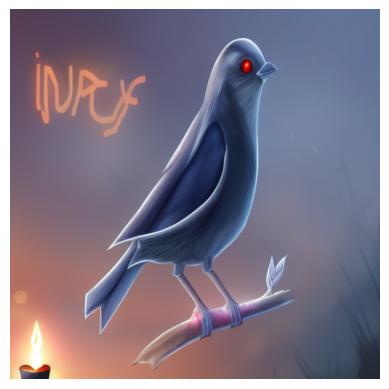

Epoch [4000/10000], Loss D: 0.6931, Loss G: 0.6906


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

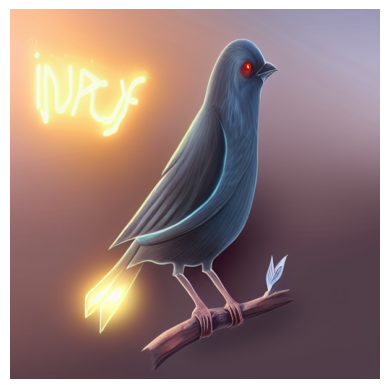

Epoch [5000/10000], Loss D: 0.6930, Loss G: 0.6997


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

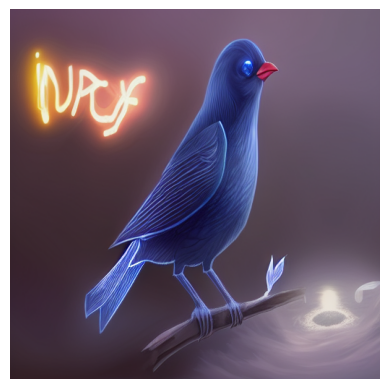

Epoch [6000/10000], Loss D: 0.6933, Loss G: 0.6907


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

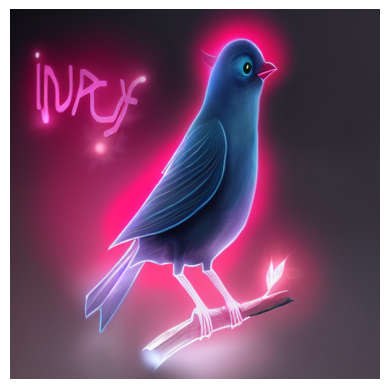

Epoch [7000/10000], Loss D: 0.6931, Loss G: 0.6945


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

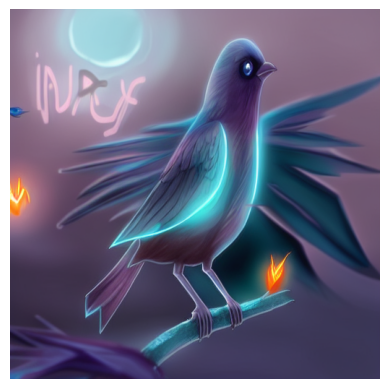

Epoch [8000/10000], Loss D: 0.6932, Loss G: 0.6978


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

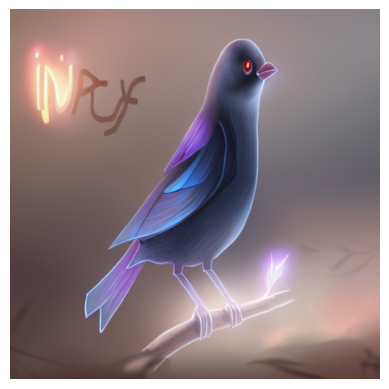

Epoch [9000/10000], Loss D: 0.6931, Loss G: 0.6907


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

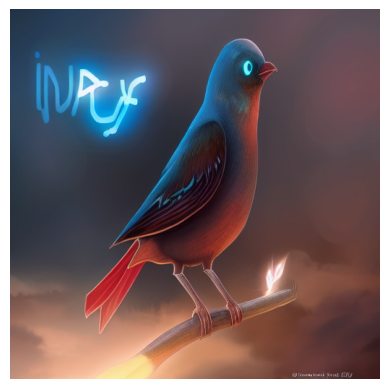

Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6943


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

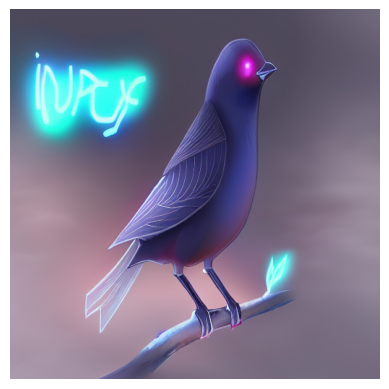

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/bird-ganh/bird.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002, display_interval=1000):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image from Stable Diffusion every 'display_interval' epochs
        if (epoch + 1) % display_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A surreal fantasy bird with horns, glowing eyes, and mystical wings, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion images at intervals
train_singan_with_image_generation(image_tensor)


Epoch [1000/10000], Loss D: 0.6886, Loss G: 0.7636


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

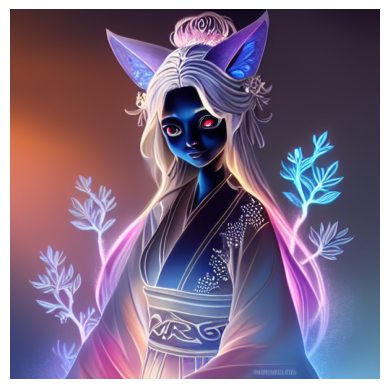

Epoch [2000/10000], Loss D: 0.6941, Loss G: 0.6840


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

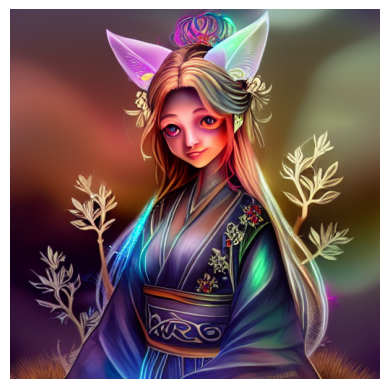

Epoch [3000/10000], Loss D: 0.6935, Loss G: 0.6955


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

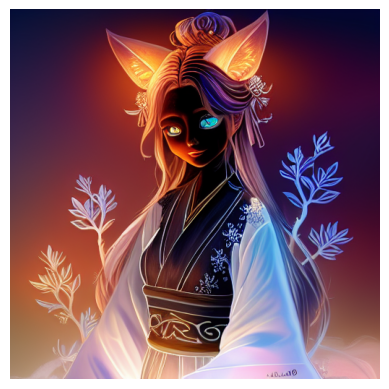

Epoch [4000/10000], Loss D: 0.6932, Loss G: 0.6881


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

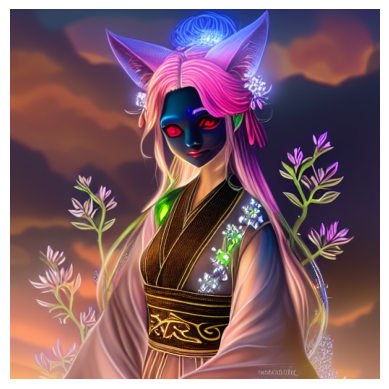

Epoch [5000/10000], Loss D: 0.6932, Loss G: 0.6994


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

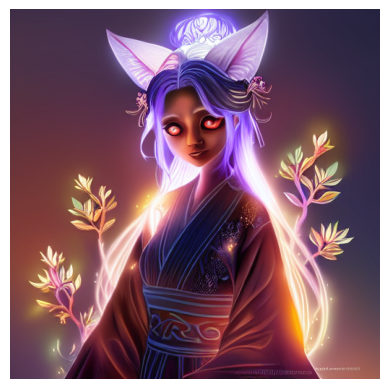

Epoch [6000/10000], Loss D: 0.6934, Loss G: 0.6668


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

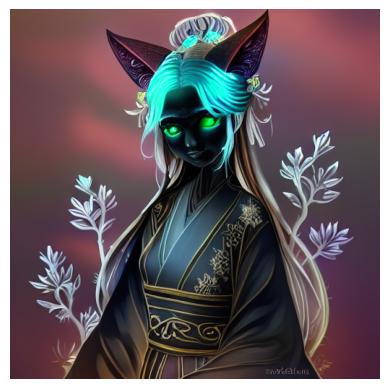

Epoch [7000/10000], Loss D: 0.6932, Loss G: 0.6894


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

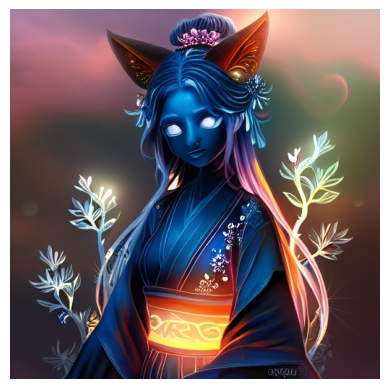

Epoch [8000/10000], Loss D: 0.6928, Loss G: 0.7031


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

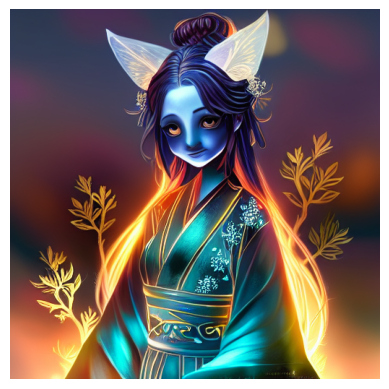

Epoch [9000/10000], Loss D: 0.6930, Loss G: 0.6917


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

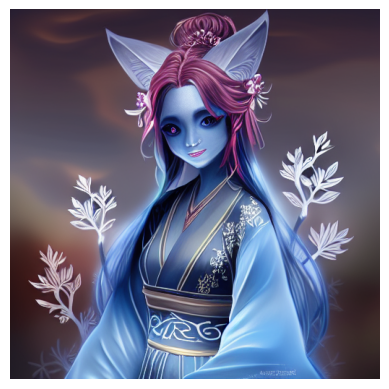

Epoch [10000/10000], Loss D: 0.6930, Loss G: 0.6962


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

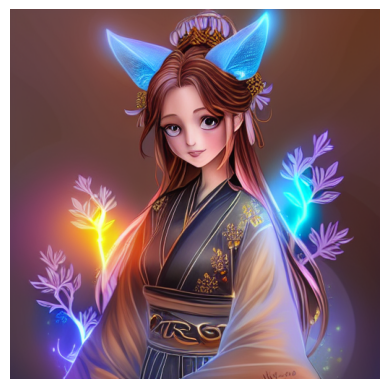

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/fairy-gann/fairy.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002, display_interval=1000):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image from Stable Diffusion every 'display_interval' epochs
        if (epoch + 1) % display_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A surreal fantasy fairy with horns, glowing eyes, and mystical wings, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion images at intervals
train_singan_with_image_generation(image_tensor)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Epoch [10000/10000], Loss D: 0.4582, Loss G: 1.0787


config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

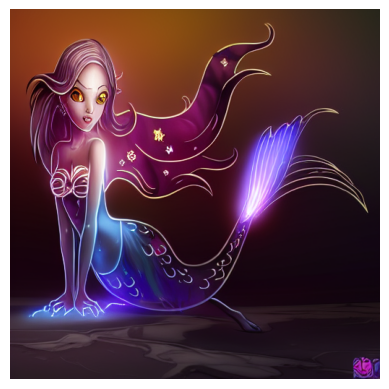

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/marmaid-gann/Draw-Mermaid.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A surreal fantasy fairy with horns, glowing eyes, and mystical wings, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6911


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

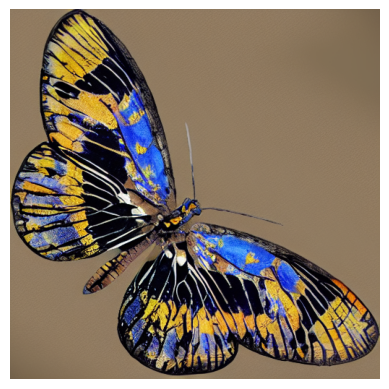

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/butterflay-gan/butterfly.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A scarry butterflay with glowing eyes, and mystical wings, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6915, Loss G: 0.7110


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

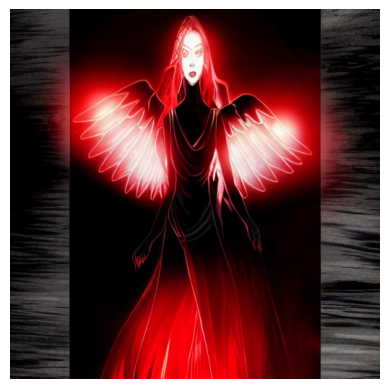

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/fairt2-gann/fairy2.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A dark and haunting fairy with twisted horns, glowing red eyes, and eerie mystical wings, ultra-detailed, 4K, digital painting, ominous atmosphere"
            negative_prompt = "blurry, low quality, distorted, friendly, whimsical"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.5196, Loss G: 0.9921


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

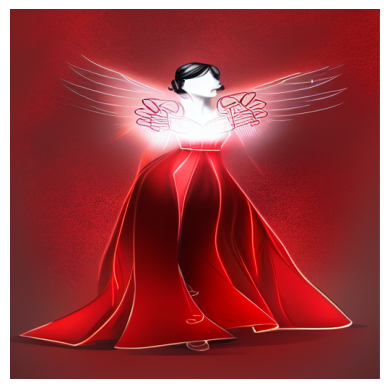

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [21]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/women-gann/human.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = " add wings,red baground, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.5291, Loss G: 0.9343


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

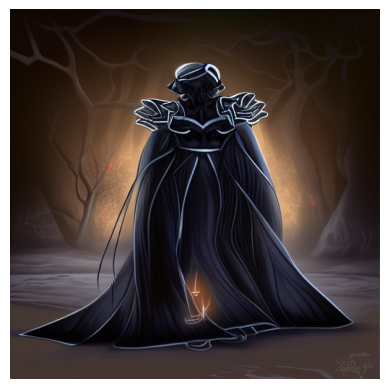

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/women-gann/human.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = " add black long horn in head, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.5141, Loss G: 1.1218


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

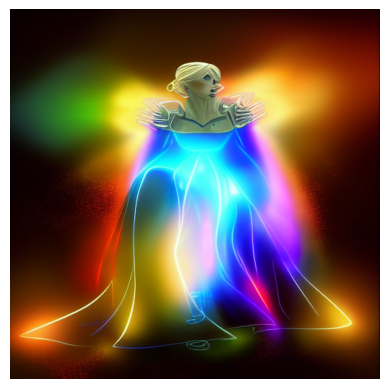

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/women-gann/human.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A glowing portal opening to another dimension, surrounded by shimmering energy, ultra-detailed, 4K, digital painting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6022, Loss G: 0.8461


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (110 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['thick with darkness , illuminated only by flickering hellish embers . ultra - detailed , 4 k , digital painting , cinematic horror , nightmarish and surreal .']


  0%|          | 0/30 [00:00<?, ?it/s]

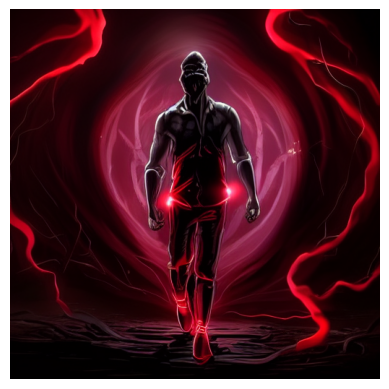

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [28]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A towering, blood-red demonic entity with a monstrous snake-like head, razor-sharp fangs, and piercing, glowing eyes. Dark smoke-like tendrils coil and stretch from its body, writhing like living shadows. Its form pulses with an eerie, otherworldly energy, exuding a sense of dread and power. The air around it is thick with darkness, illuminated only by flickering hellish embers. Ultra-detailed, 4K, digital painting, cinematic horror, nightmarish and surreal."
            negative_prompt = "blurry, low quality, distorted, soft, friendly, cartoonish, low contrast"   

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.4766, Loss G: 1.1361


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

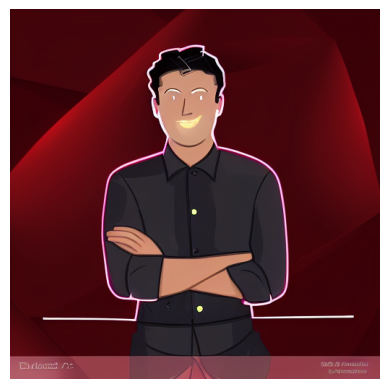

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man2-gannnnnn/man2.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            prompt = "A man with vampair face with vampair suit, digital painting, intricate lighting"
            negative_prompt = "blurry, low quality, distorted"

            # Set the batch size to 1 to generate only one image
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=30,
                num_images_per_prompt=1  # Ensure only 1 image is generated at a time
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)

Epoch [10000/10000], Loss D: 0.6926, Loss G: 0.6978


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

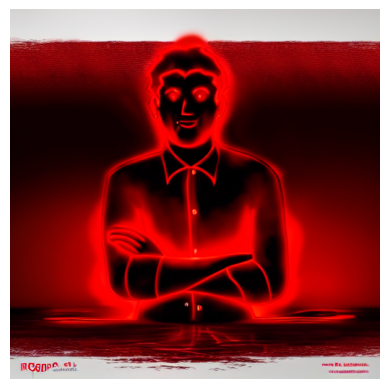

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [34]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man2-gannnnnn/man2.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
                "A sinister, blood-red, demonic figure glowing red eyes vampair, and smoke-like tendrils reaching out. "
                "Hyper-realistic, ultra-detailed, 4K cinematic horror painting, eerie lighting, terrifying atmosphere."
            )
            negative_prompt = "blurry, low quality, distorted, cartoonish, friendly, soft lighting, low contrast"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.0000, Loss G: 23.3397


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

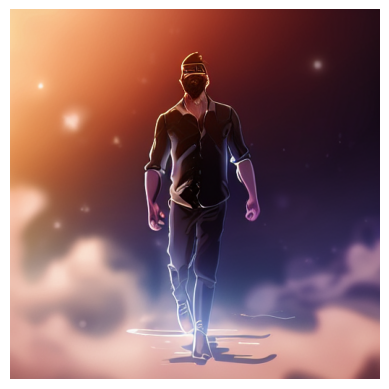

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [36]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A majestic man with long flowing hair back figure, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6036, Loss G: 0.8120


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

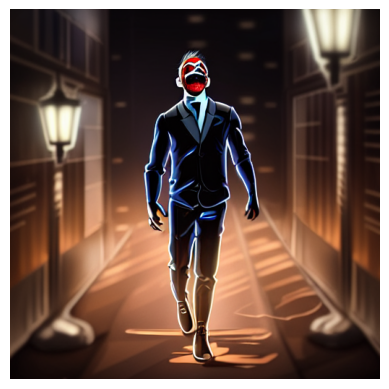

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [39]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A  man with suit joker face, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions" 
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A  man with suit joker face, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions" 
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6930, Loss G: 0.6923


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

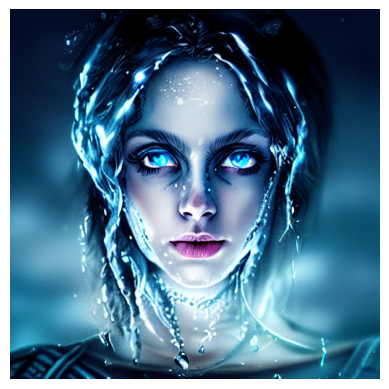

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [40]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A lady tears in ocean blue eyes, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6939, Loss G: 0.6874


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

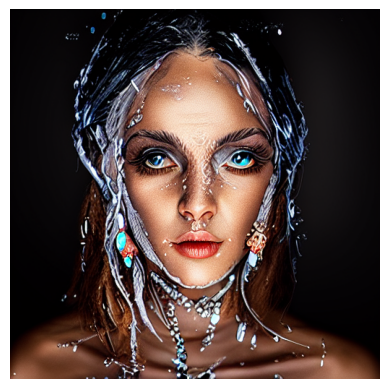

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [43]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A lady with snack face, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6924, Loss G: 0.6965


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

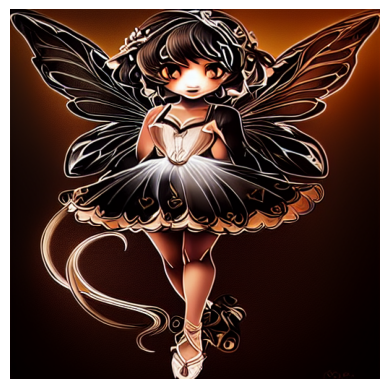

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [45]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/littel-girl-gann/littel_girl.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A lady with fox face , ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6964


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

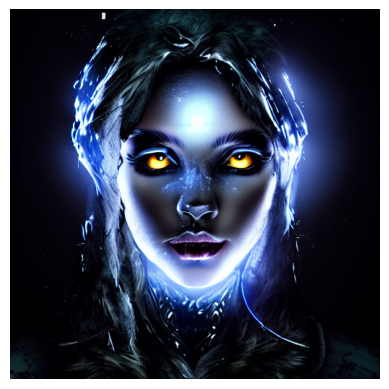

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a wolf, ultra-detailed, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6929, Loss G: 0.6902


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

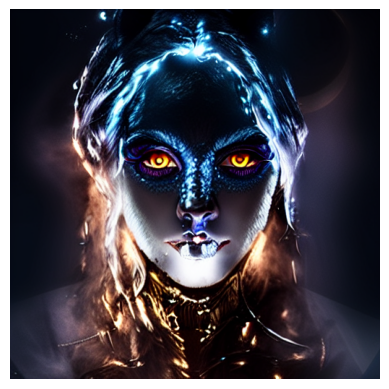

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [52]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a wolf, ultra-detailed, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6934, Loss G: 0.7041


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

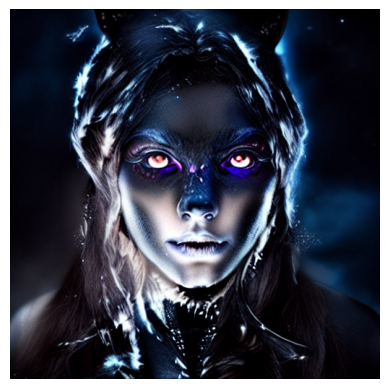

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [53]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a wolf that looks mystical, otherworldly, or not entirely human, ultra-detailed, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6928, Loss G: 0.6856


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

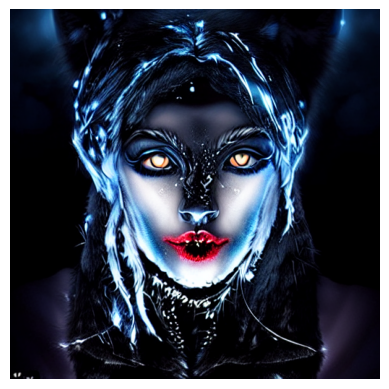

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [54]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a wolf that have both human and wolf-like traits, like fur, fangs, or glowing eyes., ultra-detailed, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6932, Loss G: 0.6901


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

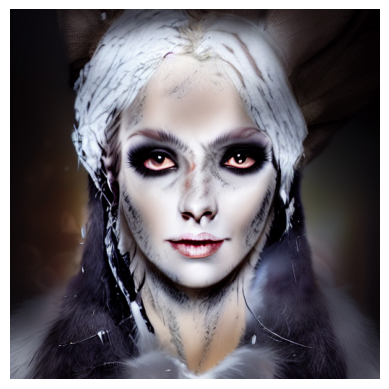

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a fox that have both human and fox-like traits,slit-pupil eyes, fur, fangs, pointed ears covered in soft fur, twitching slightly with heightened sense, ultra-detailed, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, deformed features, unnatural proportions, low-resolution, cartoonish, overly exaggerated"


            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6933, Loss G: 0.6903


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

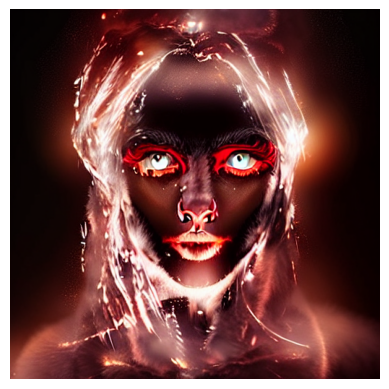

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a red fox that have both human and fox-like traits,slit-pupil eyes, fur, fangs, pointed ears covered in soft fur, twitching slightly with heightened sense, ultra-detailed, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, deformed features, unnatural proportions, low-resolution, cartoonish, overly exaggerated"


            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6943


config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (91 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['animalistic menace makes her presence both alluring and deeply unnerving']


  0%|          | 0/80 [00:00<?, ?it/s]

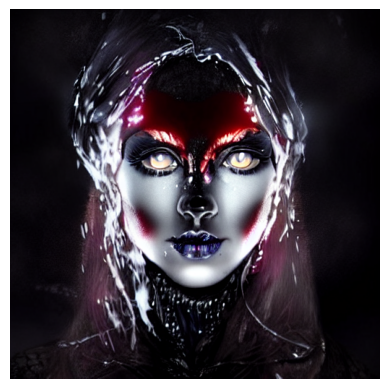

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/tears-gannn/tears.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural hybrid entity, a fusion of a woman and a red fox that have an unsettling horror character that blends human and animal features in a way that is both mesmerizing and terrifying. She exudes a sense of predatory intelligence, her eyes locking onto the viewer as if she is studying them, deciding whether they are prey or not. The mix of human beauty and animalistic menace makes her presence both alluring and deeply unnerving"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, deformed features, unnatural proportions, low-resolution, cartoonish, overly exaggerated"


            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6922, Loss G: 0.6936


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (167 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['they move in harmony , their scales gleaming like precious gemstones . she wears intricate golden armor and flowing silk robes , reminiscent of a celestial queen or goddess . the atmosphere around her is tranquil yet powerful , as if she holds dominion over the elements . she stands on an ancient marble temple bathed in moonlight , surrounded by an aura of magic and divine energy . high - quality , ultra - detailed , fantasy portrait , cinematic lighting , awe - inspiring and majestic']


  0%|          | 0/80 [00:00<?, ?it/s]

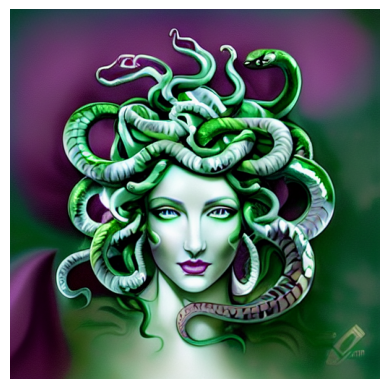

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/medusa-gan/medusa.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A supernatural being with full smiling face, a fusion of a woman and a divine serpent, embodying both beauty and wisdom. Medusa is a radiant and ethereal guardian, her presence exuding grace rather than fear. Her shimmering emerald-green eyes glow softly, filled with ancient knowledge rather than menace. Her long, flowing hair is composed of living serpents, but they move in harmony, their scales gleaming like precious gemstones. She wears intricate golden armor and flowing silk robes, reminiscent of a celestial queen or goddess. The atmosphere around her is tranquil yet powerful, as if she holds dominion over the elements. She stands on an ancient marble temple bathed in moonlight, surrounded by an aura of magic and divine energy. High-quality, ultra-detailed, fantasy portrait, cinematic lighting, awe-inspiring and majestic"
            negative_prompt = "Blurry, low-quality, bad anatomy, distorted face, extra limbs, deformed features, unnatural proportions, low-resolution, cartoonish, overly exaggerated, monstrous or horror-like, low-resolution, cartoonish, overly exaggerated"
       
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Epoch [10000/10000], Loss D: 0.6929, Loss G: 0.6933


config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

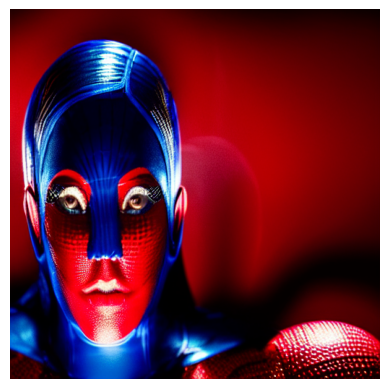

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/fullfacegirl-gan/fullFace.PNG"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed, cinematic Spider-Woman in action, mid-air dynamic pose, wearing an iconic red and blue suit with web textures, "
    ", dramatic lighting, ultra-realistic reflections, intense movement, dynamic background, photorealistic, 8K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6843


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (117 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['dramatic highlights , resembling a high - budget movie shot . the background has motion blur , emphasizing speed and agility . ultra - hd , photorealistic , breathtaking detail , realistic lighting , ultra - hd']


  0%|          | 0/80 [00:00<?, ?it/s]

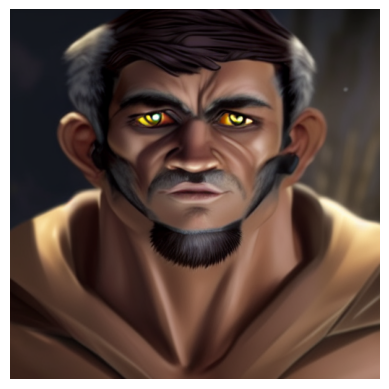

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-with-ear-gan/man_with_ear.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A highly detailed, cinematic scene of a man in intense action, leaping or dodging, with a striking cat-like face. His feline features include sharp, piercing eyes with slit pupils, pointed ears covered in short fur, prominent whiskers, and a subtle feline muzzle. His expression is fierce and focused. The lighting is ultra-realistic, with dynamic shadows and dramatic highlights, resembling a high-budget movie shot. The background has motion blur, emphasizing speed and agility. Ultra-HD, photorealistic, breathtaking detail, realistic lighting, ultra-HD"
            negative_prompt = "low-quality, blurry, distorted"
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6932, Loss G: 0.6944


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (115 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', resembling a high - budget movie shot . the background has motion blur , emphasizing speed and agility . ultra - hd , photorealistic , breathtaking detail , realistic lighting , ultra - hd']


  0%|          | 0/80 [00:00<?, ?it/s]

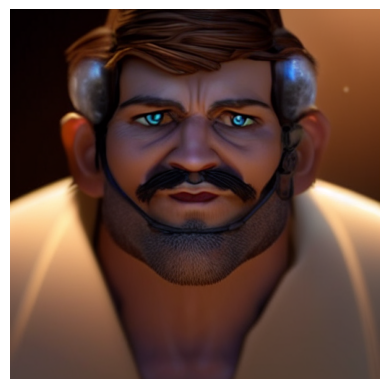

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-with-ear-gan/man_with_ear.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A highly detailed, cinematic scene of a man in intense action, leaping or dodging, with a striking cat-like face, Large almond-shaped with vertical slit pupils, His face is framed by long, delicate whiskers extending from his cheeks and upper lip, resembling a majestic cat's mustache,The lighting is ultra-realistic, with dynamic shadows and dramatic highlights, resembling a high-budget movie shot. The background has motion blur, emphasizing speed and agility. Ultra-HD, photorealistic, breathtaking detail, realistic lighting, ultra-HD"
            negative_prompt = "low-quality, blurry, distorted"
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6929, Loss G: 0.6870


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

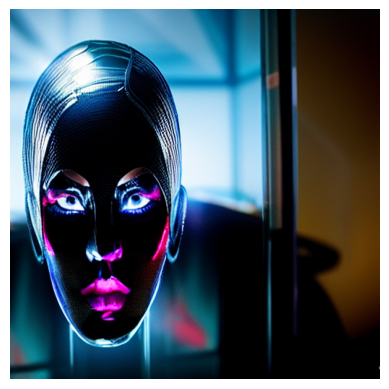

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/fullfacegirl-gan/fullFace.PNG"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "spiderWomen"
    ", dramatic lighting, ultra-realistic reflections, intense movement, photorealistic, 8K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6033, Loss G: 0.8130


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

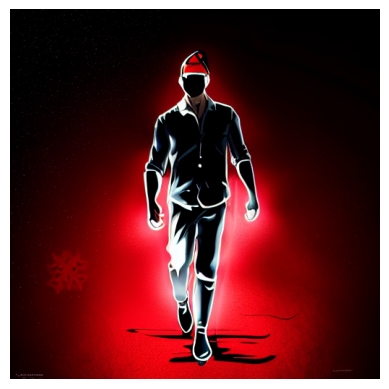

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [6]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A  man with joker face and chrismas santa suit, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6958, Loss G: 0.7150


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

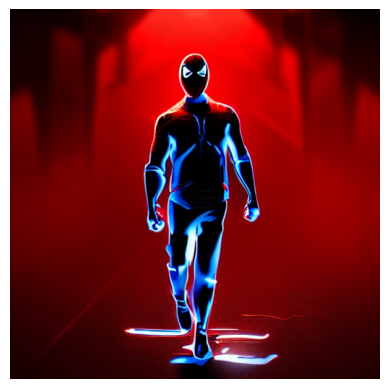

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [11]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/man-gannn/man.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = "A majestic spiderman, ultra-detailed, digital painting, cinematic depth, realistic textures, fantasy lighting, high-quality character portrait"
            negative_prompt = "blurry, low quality, bad anatomy, distorted face, extra limbs, unrealistic proportions"
        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Epoch [10000/10000], Loss D: 0.6909, Loss G: 0.6939


config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

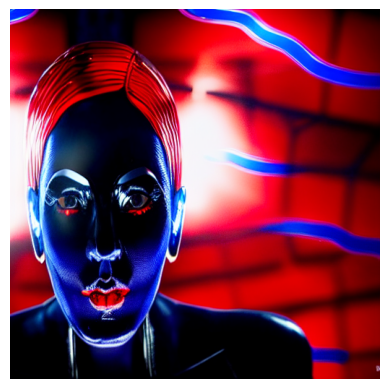

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/fullfacegirl-gan/fullFace.PNG"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed, cinematic Spider-Woman in action, wearing an iconic red and blue suit with web textures in face, "
    ", dramatic lighting, ultra-realistic reflections, intense movement, photorealistic, 8K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6920, Loss G: 0.6928


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

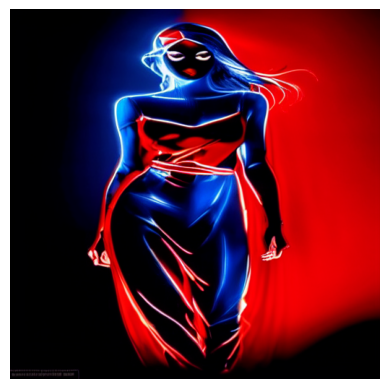

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/standing-women-gan/standing women.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed, cinematic Spider-Woman in action, wearing an iconic red and blue suit with web textures in face, "
    ", dramatic lighting, ultra-realistic reflections, intense movement, photorealistic, 8K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6928, Loss G: 0.6955


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

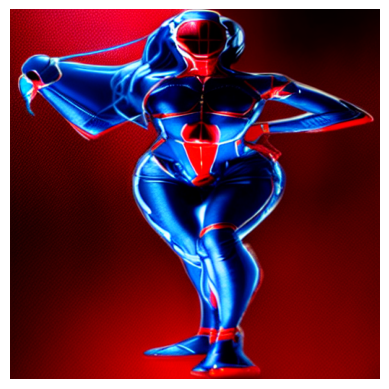

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/standing-women2/standing women2.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed, cinematic Spider-Woman wearing an iconic red and blue suit with web textures in face, "
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6927, Loss G: 0.6925


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

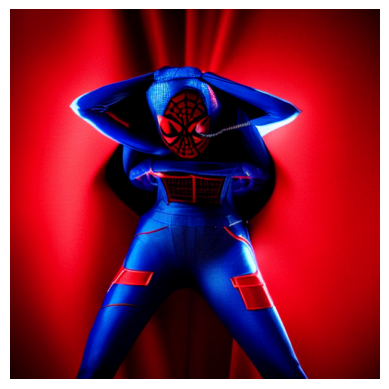

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/standingwomen-3/standingWomen_3.png"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed, cinematic Spider-Woman wearing an iconic red and blue suit with web textures in face, "
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6929, Loss G: 0.6887


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

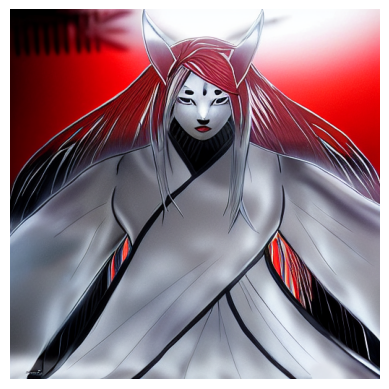

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/kaguya-gan/kaguyea.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A highly detailed,Kagguya in white fox face, "
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)


Epoch [10000/10000], Loss D: 0.6930, Loss G: 0.6849


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

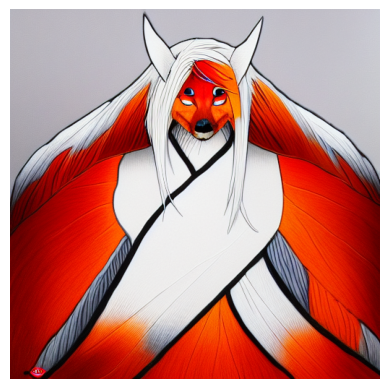

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

Epoch [10000/10000], Loss D: 0.6904, Loss G: 0.6983


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

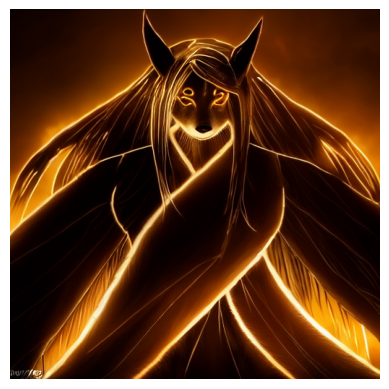

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [7]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/kaguya-gan/kaguyea.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A humanoid fox hybrid, elegant anthropomorphic character, detailed fur texture, soft fox ears, expressive face, golden eyes, fantasy lighting, digital painting "
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, Marvel-inspired, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



Epoch [10000/10000], Loss D: 0.6930, Loss G: 0.6961


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

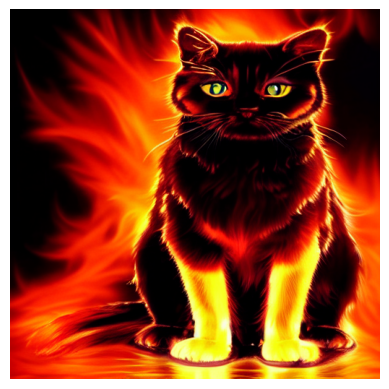

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [11]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/cat-gan/cat.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "a majestic cat with phoenix-like features, glowing fiery two wings"
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



Epoch [10000/10000], Loss D: 0.6931, Loss G: 0.6871


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

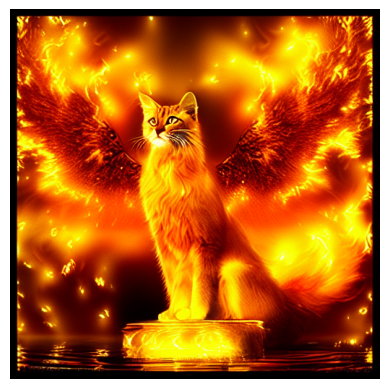

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [13]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/ccccctttttt/cccccaaaattt.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "a majestic golden cat with phoenix-like features, glowing fiery two wings"
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



Epoch [10000/10000], Loss D: 0.6933, Loss G: 0.6930


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

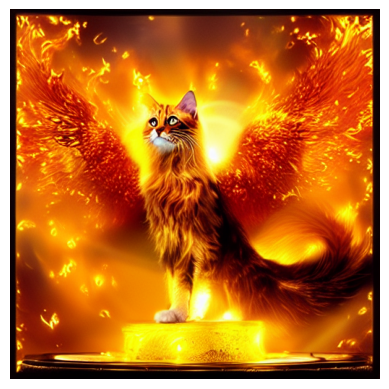

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [14]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/ccccctttttt/cccccaaaattt.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "a majestic golden full face smiling cat with phoenix-like features standing above watter, glowing fiery two wings"
    " ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



Epoch [10000/10000], Loss D: 0.6795, Loss G: 0.7251


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

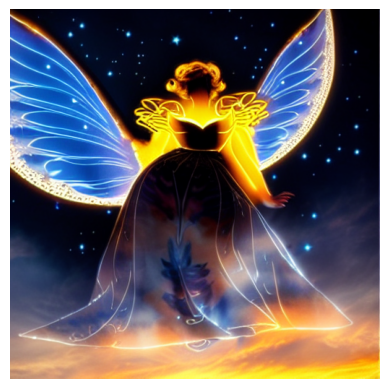

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [19]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/women-gann/human.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "a majestic moon fairy with phoenix-like features , glowing fiery two wings"
    " white baground, ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



Epoch [10000/10000], Loss D: 0.6936, Loss G: 0.6840


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

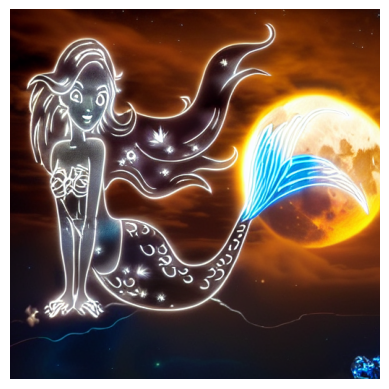

Generator(
  (latent_fc): Linear(in_features=128, out_features=16384, bias=True)
  (feature_fc): Linear(in_features=10, out_features=16384, bias=True)
  (main): Sequential(
    (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Tanh()
  )
)

In [20]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/marmaid-gann/Draw-Mermaid.jpg"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "a majestic moon fairy with phoenix-like features , glowing fiery two wings"
    " white baground, ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)



In [ ]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import cv2

# ============ 1️⃣ Load and Preprocess Image ============
def load_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize to fixed size
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

def load_and_preprocess_image(image_path):
    """Load an image and extract edges using Canny."""
    image = Image.open(image_path).convert("RGB")
    image = image.resize((512, 512))

    # Convert to grayscale and detect edges
    image_np = np.array(image)
    edges = cv2.Canny(image_np, 100, 200)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Convert back to PIL format
    edge_image = Image.fromarray(edges)
    return image, edge_image

image_path = "/kaggle/input/bbird2"  # Change this to your image path
image_tensor = load_image(image_path)
input_image, control_image = load_and_preprocess_image(image_path)

# ============ 2️⃣ Define Generator with Feature Vector ============
class Generator(nn.Module):
    def __init__(self, input_channels=3, latent_dim=128, feature_dim=10):
        super(Generator, self).__init__()
        
        self.latent_fc = nn.Linear(latent_dim, 128 * 128)  # Latent vector to image size
        self.feature_fc = nn.Linear(feature_dim, 128 * 128)  # Feature vector processing
        
        self.main = nn.Sequential(
            nn.Conv2d(input_channels + 2, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, input_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x, latent_vector, feature_vector):
        latent_map = self.latent_fc(latent_vector).view(1, 1, 128, 128)
        feature_map = self.feature_fc(feature_vector).view(1, 1, 128, 128)
        
        # Concatenate input image, latent vector map, and feature map
        x = torch.cat((x, latent_map, feature_map), dim=1)
        return self.main(x)

# ============ 3️⃣ Define Discriminator ============
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# ============ 4️⃣ Training Loop with Stable Diffusion Image Generation ============
def train_singan_with_image_generation(image_tensor, num_epochs=10000, lr=0.0002):
    generator.train()
    discriminator.train()
    
    criterion = nn.BCELoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=3000, gamma=0.5)
    scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=3000, gamma=0.5)
    
    real_label = torch.ones(1, 1, 128, 128).to(device)
    fake_label = torch.zeros(1, 1, 128, 128).to(device)
    
    image_tensor = image_tensor.to(device)

    for epoch in range(num_epochs):
        # Generate random latent vector and feature vector
        latent_vector = torch.randn(1, 128).to(device)
        feature_vector = torch.randint(0, 2, (1, 10)).float().to(device)  # Random binary features
        
        # Train Discriminator
        optimizer_d.zero_grad()
        
        output_real = discriminator(image_tensor)
        loss_real = criterion(output_real, real_label)
        
        fake_image = generator(image_tensor, latent_vector, feature_vector)
        output_fake = discriminator(fake_image.detach())
        loss_fake = criterion(output_fake, fake_label)
        
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        optimizer_g.zero_grad()
        output_fake = discriminator(fake_image)
        loss_g = criterion(output_fake, real_label)
        loss_g.backward()
        optimizer_g.step()

        scheduler_g.step()
        scheduler_d.step()

        # Generate and display an image only during the final epoch
        if epoch + 1 == num_epochs:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")
            
            # Generate Modified Image using Stable Diffusion + ControlNet
            controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
            pipe = StableDiffusionControlNetPipeline.from_pretrained(
                "runwayml/stable-diffusion-v1-5",
                controlnet=controlnet,
                torch_dtype=torch.float16
            )
            pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
            pipe.to(device)

            # Updated scary horror prompt
            prompt = (
    "A surreal fantasy scarry bird with horns, glowing eyes, and mystical 100 wings"
    " white baground, ultra-realistic reflections, intense movement, photorealistic, 4K, ultra-HD, "
    "high detail, cinematic shot, realistic shadows and highlights, stunning visual effects."
)

            negative_prompt = (
    "low-quality, blurry, distorted, deformed hands, unrealistic anatomy, extra limbs, disproportioned body, dull colors, flat lighting, "
    "lack of detail, pixelated, low-resolution, overexposed, unnatural face, wrong perspective, stiff pose, grainy texture."
)

        
            generated_image = pipe(
                prompt=prompt,
                image=control_image,  # Use edge-detected image as control input
                negative_prompt=negative_prompt,
                num_inference_steps=80,  # Increased steps for better quality
                guidance_scale=12,  # Stronger prompt adherence
                num_images_per_prompt=1  # Ensure only 1 image is generated
            ).images[0]

            # Display Generated Image
            plt.imshow(generated_image)
            plt.axis("off")  # Hide axes
            plt.show()

    return generator

# Start training the GAN and generate Stable Diffusion image only during the final epoch
train_singan_with_image_generation(image_tensor)

